<a href="https://colab.research.google.com/github/vunky-himawan/PCVK/blob/main/Week_10.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

### 1. Global Threshold (BINARY, BINARY_INV, TRUNC, TOZERO, TOZERO_INV), dengan threshold= 170,

In [4]:
filename = ('/content/drive/MyDrive/Colab Notebooks/PCVK/Images/gradient.jpg')
img = cv2.imread(filename)
thresh = 170

In [16]:
binary_threshold = np.where(img > thresh, 255, 0).astype(np.uint8)
binary_inverted_threshold = np.where(img < thresh, 255, 0).astype(np.uint8)
truncate_threshold = np.where(img > thresh, thresh, img).astype(np.uint8)
to_zero_threshold = np.where(img > thresh, img, 0).astype(np.uint8)
to_zero_inverted_threshold = np.where(img > thresh, 0, img).astype(np.uint8)

In [17]:
titles = ['Original Image','BINARY','BINARY_INV','TRUNC', 'TOZERO', 'TOZERO_INV']
images = [img, binary_threshold, binary_inverted_threshold, truncate_threshold, to_zero_threshold, to_zero_inverted_threshold]

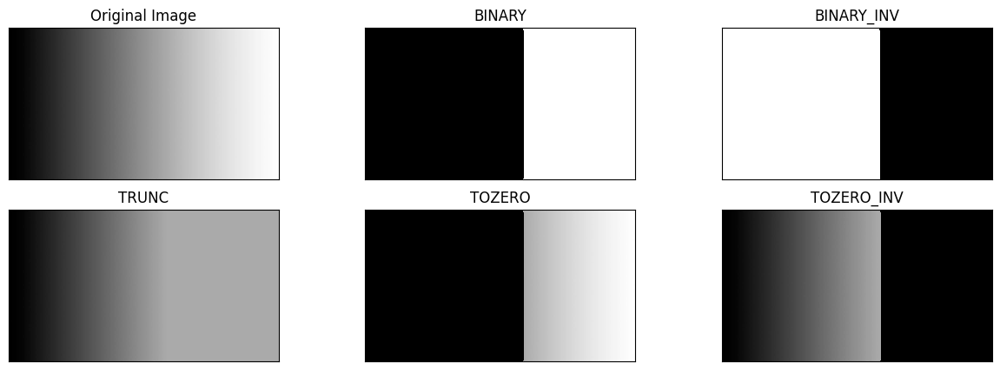

In [18]:
plt.figure(figsize = (15,5))
for i in range(len(images)):
  plt.subplot(2,3,i+1),plt.imshow(images[i],'gray', interpolation='nearest')
  plt.title(titles[i])
  plt.xticks([]),plt.yticks([])
plt.show()

### 2. Otsu Thresholding tanpa menggunakan Library

In [19]:
balloon = '/content/drive/MyDrive/Colab Notebooks/PCVK/Images/balloon.jpg'
image = cv2.imread(balloon)
grayscale_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

In [20]:
def otsu_threshold(image):
    # 1. Hitung Histogram
    hist, _ = np.histogram(image.flatten(), bins=256, range=[0, 256])

    # 2. Hitung Probabilitas
    total_pixels = image.size
    probability = hist / total_pixels

    # 3. Hitung Rata-rata Global
    global_mean = np.sum(np.arange(256) * probability)

    max_variance = 0
    optimal_threshold = 0

    # 4. Iterasi untuk setiap Threshold
    for t in range(256):
        # Kelas 1: Piksel di bawah threshold
        w0 = np.sum(probability[:t])
        if w0 == 0:
            continue

        # Kelas 2: Piksel di atas threshold
        w1 = np.sum(probability[t:])
        if w1 == 0:
            break

        # Rata-rata kelas 1
        mu0 = np.sum(np.arange(t) * probability[:t]) / w0

        # Rata-rata kelas 2
        mu1 = np.sum(np.arange(t, 256) * probability[t:]) / w1

        # 5. Hitung Variansi Antar Kelas
        variance = w0 * w1 * (mu0 - mu1) ** 2

        # Pilih Threshold Optimal
        if variance > max_variance:
            max_variance = variance
            optimal_threshold = t

    return optimal_threshold

In [21]:
otsu_threshold = otsu_threshold(grayscale_image)

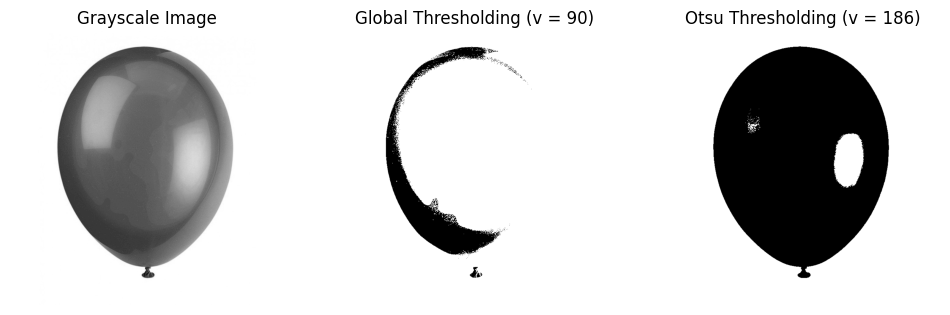

In [22]:
binary_image = (grayscale_image > otsu_threshold).astype(np.uint8) * 255  # Konversi ke 255 untuk piksel putih
global_threshold = (grayscale_image > 90).astype(np.uint8) * 255

# Tampilkan citra grayscale dan citra biner menggunakan Matplotlib
plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.imshow(grayscale_image, cmap='gray')
plt.axis('off')
plt.title('Grayscale Image')

plt.subplot(1, 3, 2)
plt.imshow(global_threshold, cmap='gray')
plt.axis('off')
plt.title('Global Thresholding (v = 90)')

plt.subplot(1, 3, 3)
plt.imshow(binary_image, cmap='gray')
plt.axis('off')
plt.title('Otsu Thresholding (v = 186)')

plt.show()

# 3. Histogram dari citra tersegmentasi, Histogram hanya pada foreground image saja.

In [67]:
tobacco = cv2.imread('/content/drive/MyDrive/Colab Notebooks/PCVK/Images/tobacco.jpg')
tobacco = cv2.cvtColor(tobacco, cv2.COLOR_BGR2RGB)

In [68]:
r, g, b = cv2.split(tobacco)

# Hitung histogram untuk setiap saluran
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])

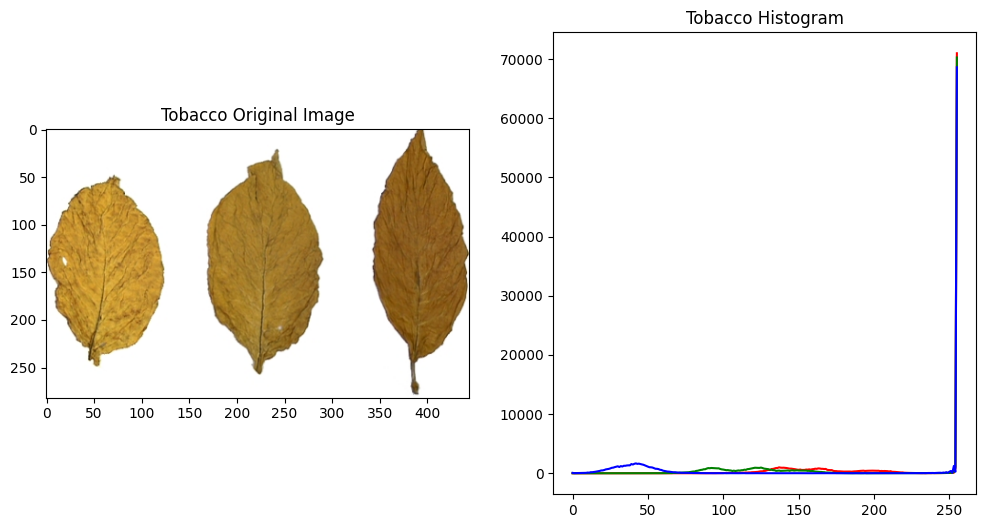

In [69]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(tobacco)
plt.title('Tobacco Original Image')

plt.subplot(1, 2, 2)
plt.plot(hist_r, color='red', label='Red Channel')
plt.plot(hist_g, color='green', label='Green Channel')
plt.plot(hist_b, color='blue', label='Blue Channel')
plt.title('Tobacco Histogram')

plt.show()

In [71]:
tobacco_gray = cv2.cvtColor(tobacco, cv2.COLOR_RGB2GRAY)
_, binary_tobacco = cv2.threshold(tobacco_gray, 240, 255, cv2.THRESH_BINARY_INV)

In [72]:
# Calculate histograms using the binary mask
hist_r = cv2.calcHist([r], [0], binary_tobacco, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], binary_tobacco, [256], [0, 256])
hist_b = cv2.calcHist([b], [0], binary_tobacco, [256], [0, 256])

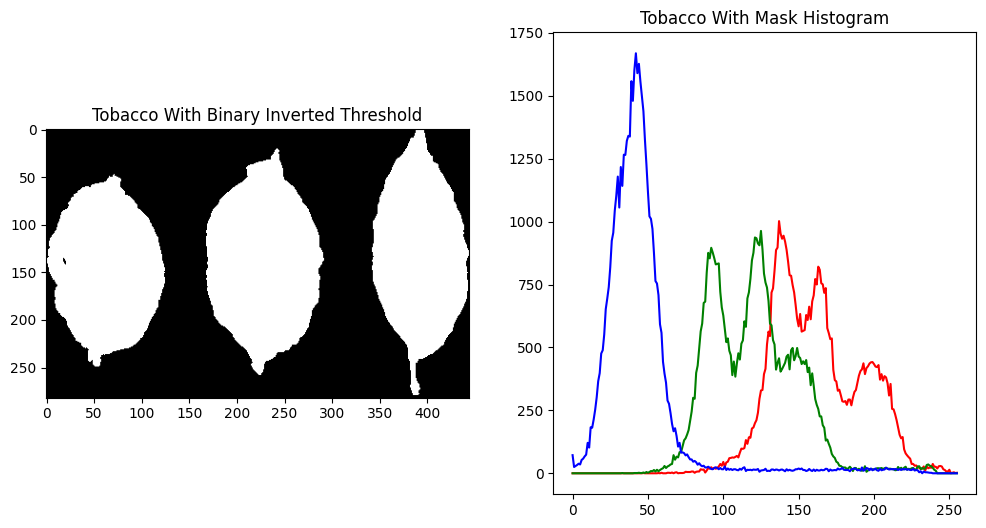

In [74]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(binary_tobacco, cmap='gray')
plt.title('Tobacco With Binary Inverted Threshold')

plt.subplot(1, 2, 2)
plt.plot(hist_r, color='red', label='Red Channel')
plt.plot(hist_g, color='green', label='Green Channel')
plt.plot(hist_b, color='blue', label='Blue Channel')
plt.title('Tobacco With Mask Histogram')

plt.show()

# 4. segmentasi warna pada image "peppers.jpg", munculkan hanya warna yang kuning saja.

In [75]:
from sklearn.cluster import KMeans

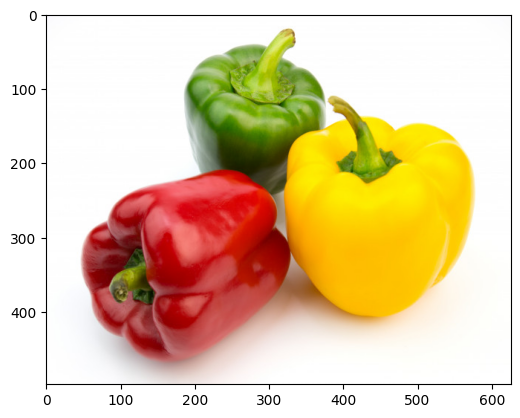

In [150]:
image = cv2.imread('/content/drive/MyDrive/Colab Notebooks/PCVK/Images/peppers.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.imshow(image)

In [151]:
pappers = image.astype('float32')
pixel_values = pappers.reshape(-1, 3)

In [152]:
K = 6
kmeans = KMeans(n_clusters=K, init = "k-means++", random_state=42)
kmeans.fit(pixel_values)

KMeans(n_clusters=6, random_state=42)

In [140]:
labels = kmeans.labels_
centers = kmeans.cluster_centers_

In [157]:
yellow_cluster = None
yellow_rgb = np.array([255, 255, 0])
min_distance = float('inf')
for i, center in enumerate(centers):
    distance = np.linalg.norm(center - yellow_rgb)
    if distance < min_distance:
        min_distance = distance
        yellow_cluster = i

In [164]:
mask = (labels == yellow_cluster)
mask = mask.reshape(image.shape[:2])

white_background = np.ones_like(image) * 255

segmented_image = np.where(mask[:, :, None], image, white_background)

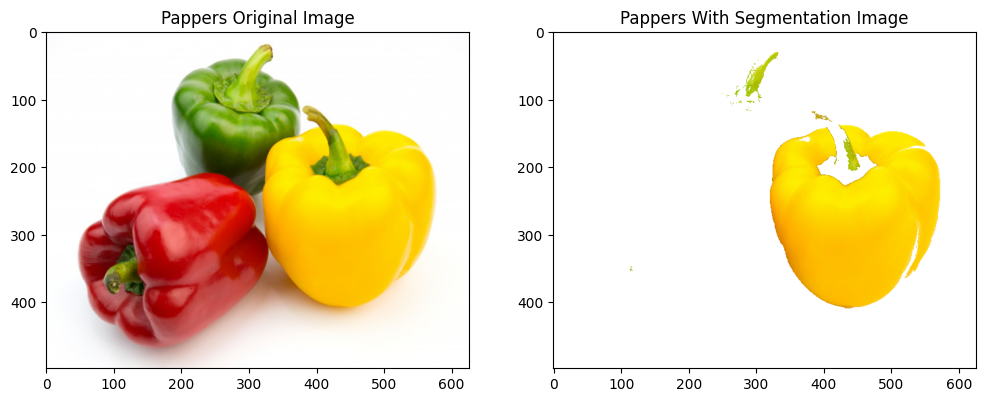

In [184]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Pappers Original Image')

plt.subplot(1, 2, 2)
plt.imshow(segmented_image)
plt.title('Pappers With Segmentation Image')

plt.show()

# 5. Melakukan thresholding biner pada crossword.jpg.

In [215]:
crossword = cv2.imread('/content/drive/MyDrive/Colab Notebooks/PCVK/Images/crossword.jpg')
crossword_gray = cv2.cvtColor(crossword, cv2.COLOR_BGR2GRAY)

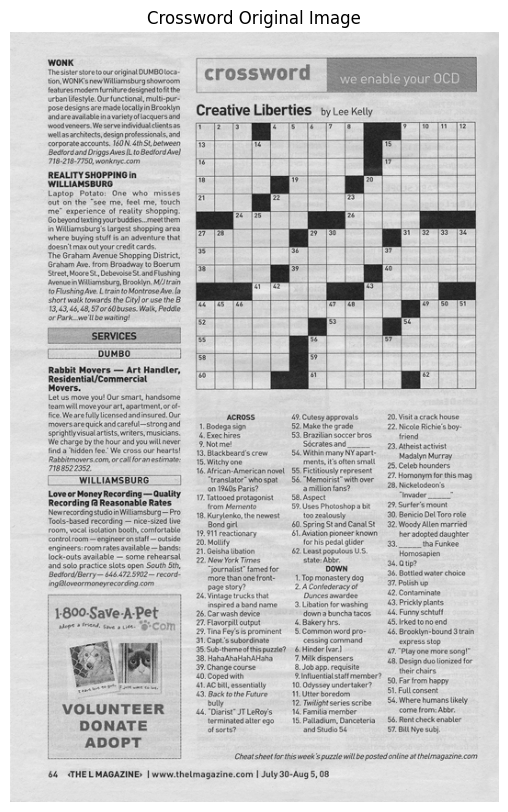

In [200]:
plt.figure(figsize=(15, 10))
plt.imshow(crossword_gray, cmap='gray')
plt.title('Crossword Original Image')
plt.axis('off')
plt.show()

In [203]:
_, crossword_binary_threshold = cv2.threshold(crossword_gray, 127, 255, cv2.THRESH_BINARY)
_, crossword_binary_inv_threshold = cv2.threshold(crossword_gray, 127, 255, cv2.THRESH_BINARY_INV)
_, crossword_truncate_threshold = cv2.threshold(crossword_gray, 127, 255, cv2.THRESH_TRUNC)
_, crossword_to_zero_threshold = cv2.threshold(crossword_gray, 127, 255, cv2.THRESH_TOZERO)
_, crossword_to_zero_inv_threshold = cv2.threshold(crossword_gray, 127, 255, cv2.THRESH_TOZERO_INV)
_, crossword_otsu_threshold = cv2.threshold(crossword_gray, 127, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
crossword_adaptive_mean_threshold = cv2.adaptiveThreshold(crossword_gray,255,cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY,11,2)
crossword_adaptive_gaussian_threshold = cv2.adaptiveThreshold(crossword_gray,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,11,2)

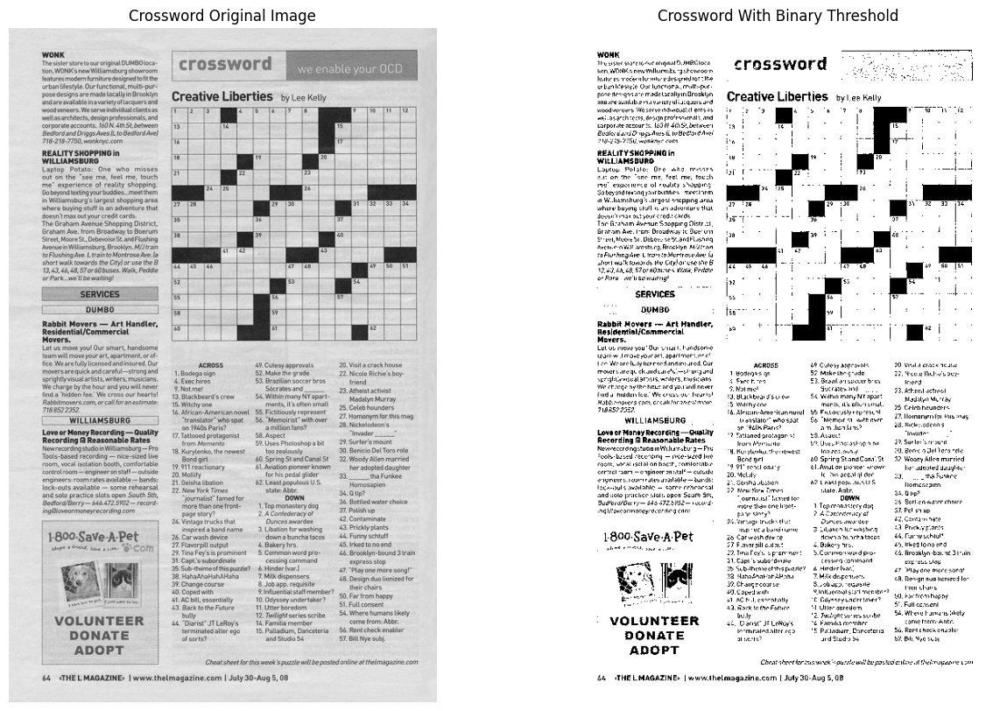

In [216]:
plt.figure(figsize=(15, 10))
plt.subplot(1, 2, 1)
plt.imshow(crossword_gray, cmap='gray')
plt.title('Crossword Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(crossword_binary_threshold, cmap='gray')
plt.title('Crossword With Binary Threshold')
plt.axis('off')
plt.show()

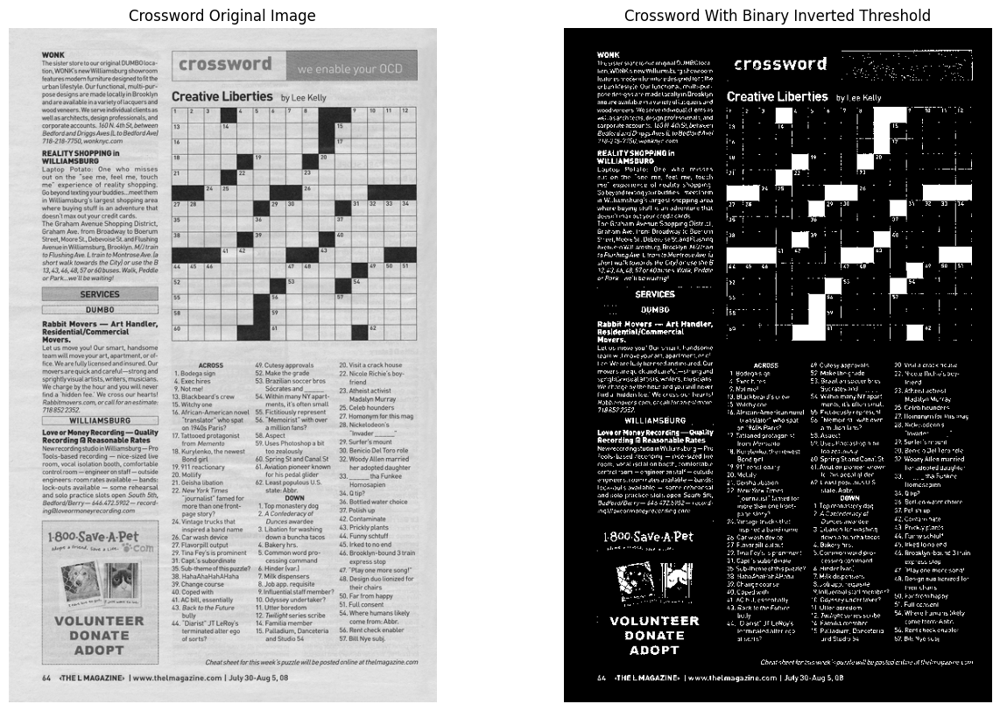

In [219]:
plt.figure(figsize=(15, 10))
plt.subplot(1, 2, 1)
plt.imshow(crossword_gray, cmap='gray')
plt.title('Crossword Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(crossword_binary_inv_threshold, cmap='gray')
plt.title('Crossword With Binary Inverted Threshold')
plt.axis('off')
plt.show()

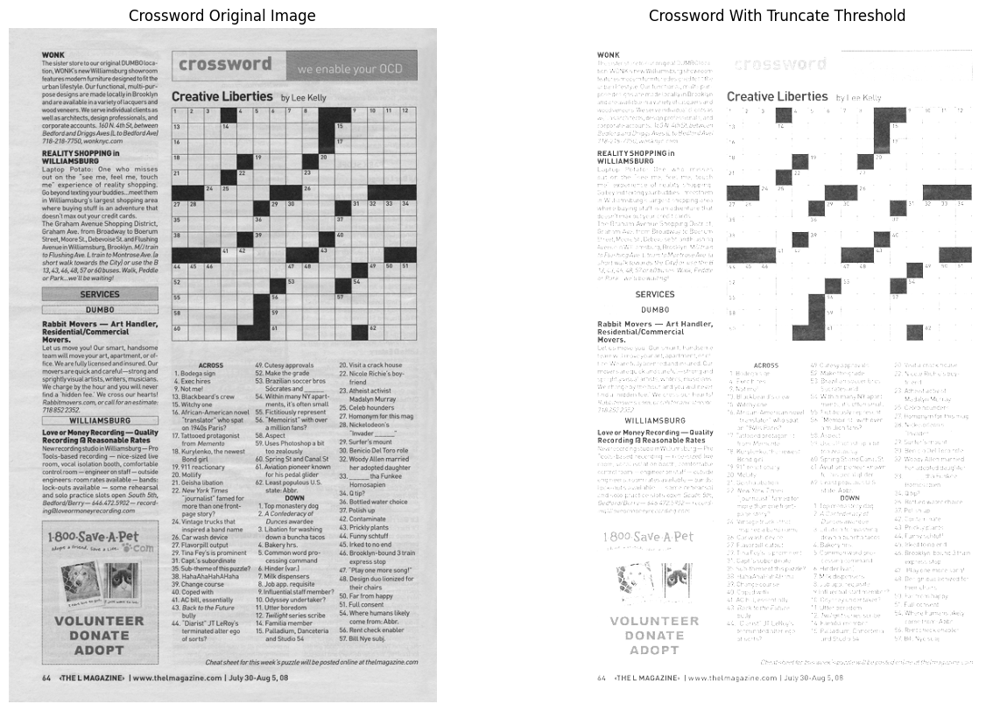

In [220]:
plt.figure(figsize=(15, 10))
plt.subplot(1, 2, 1)
plt.imshow(crossword_gray, cmap='gray')
plt.title('Crossword Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(crossword_truncate_threshold, cmap='gray')
plt.title('Crossword With Truncate Threshold')
plt.axis('off')
plt.show()

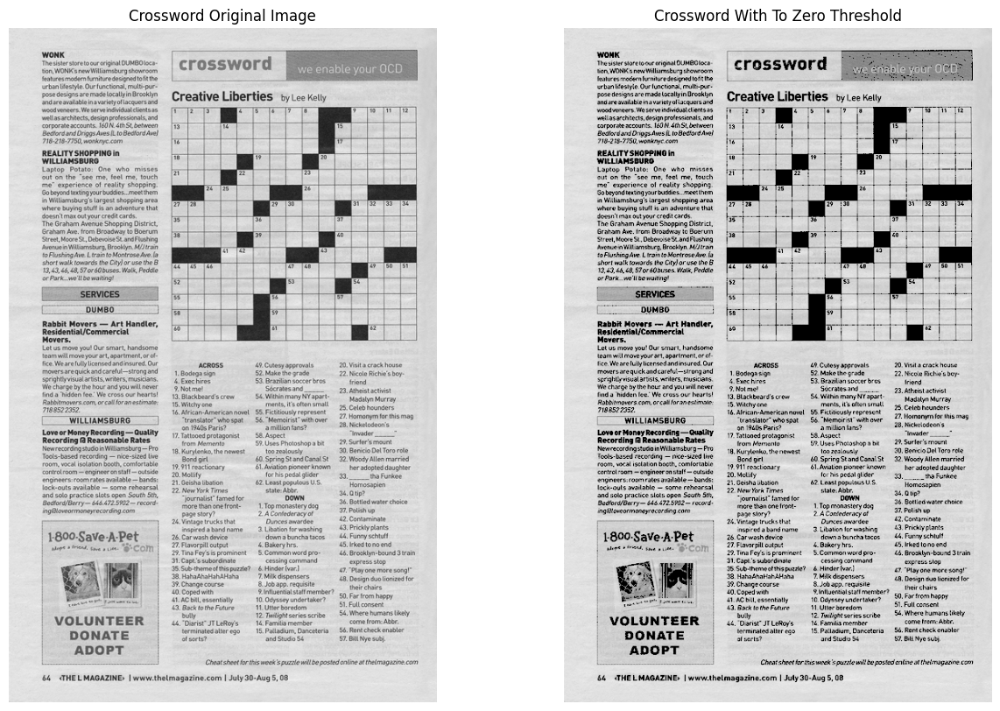

In [221]:
plt.figure(figsize=(15, 10))
plt.subplot(1, 2, 1)
plt.imshow(crossword_gray, cmap='gray')
plt.title('Crossword Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(crossword_to_zero_threshold, cmap='gray')
plt.title('Crossword With To Zero Threshold')
plt.axis('off')
plt.show()

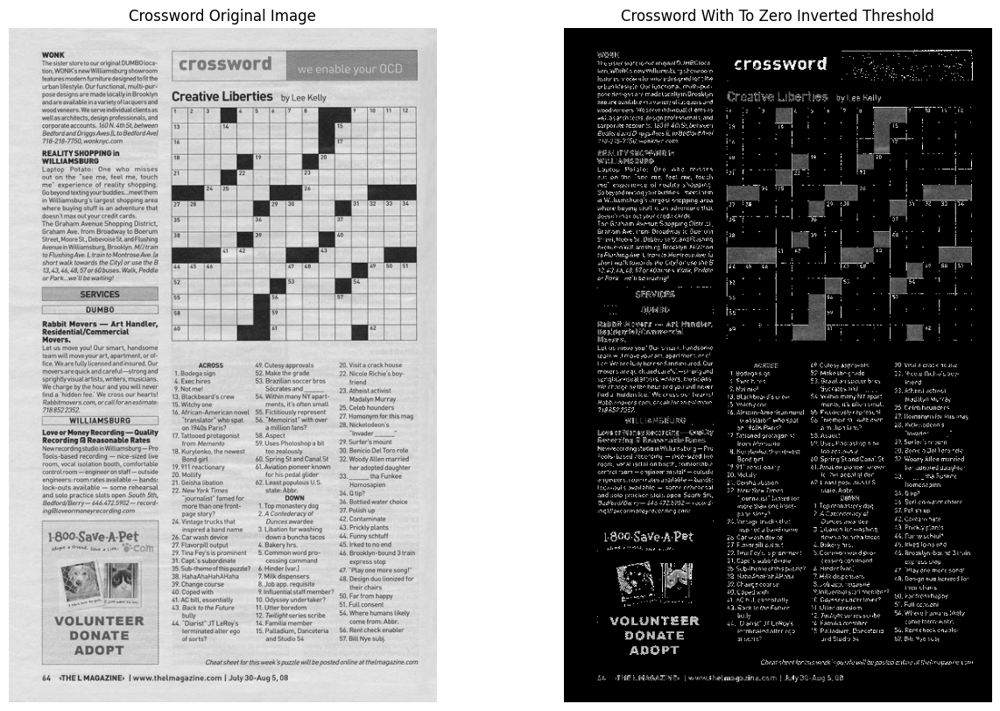

In [223]:
plt.figure(figsize=(15, 10))
plt.subplot(1, 2, 1)
plt.imshow(crossword_gray, cmap='gray')
plt.title('Crossword Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(crossword_to_zero_inv_threshold, cmap='gray')
plt.title('Crossword With To Zero Inverted Threshold')
plt.axis('off')
plt.show()

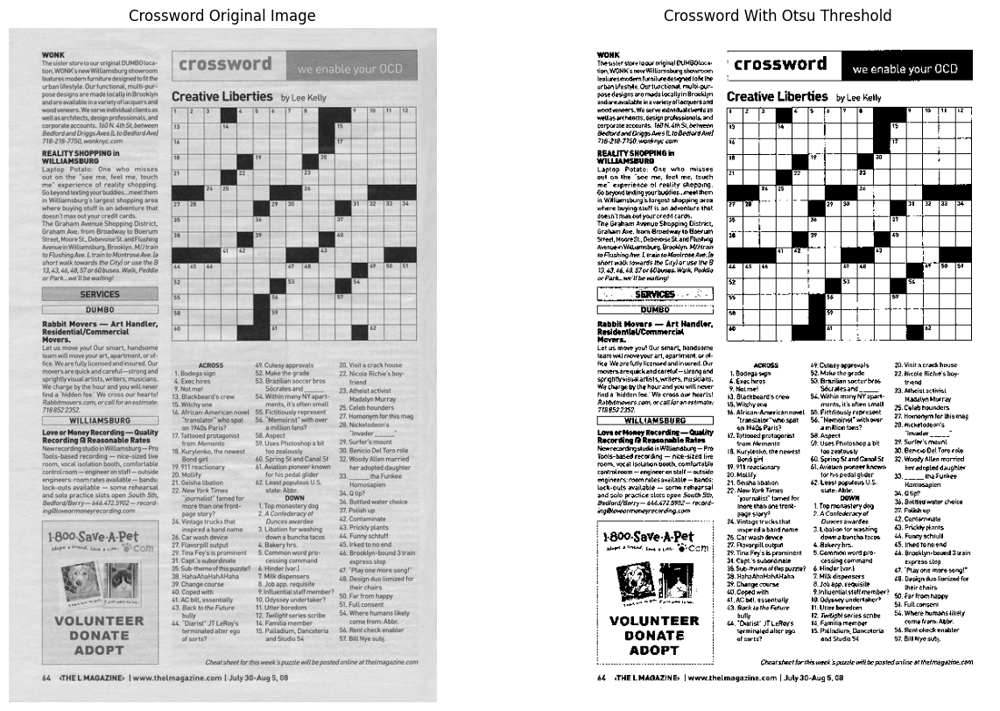

In [224]:
plt.figure(figsize=(15, 10))
plt.subplot(1, 2, 1)
plt.imshow(crossword_gray, cmap='gray')
plt.title('Crossword Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(crossword_otsu_threshold, cmap='gray')
plt.title('Crossword With Otsu Threshold')
plt.axis('off')
plt.show()

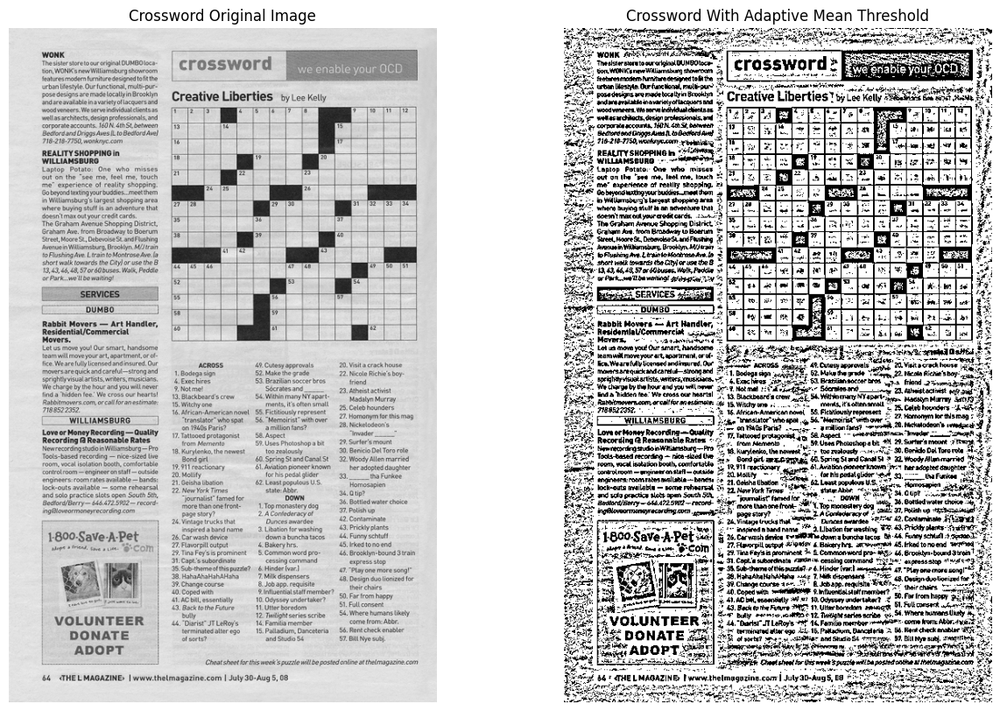

In [225]:
plt.figure(figsize=(15, 10))
plt.subplot(1, 2, 1)
plt.imshow(crossword_gray, cmap='gray')
plt.title('Crossword Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(crossword_adaptive_mean_threshold, cmap='gray')
plt.title('Crossword With Adaptive Mean Threshold')
plt.axis('off')
plt.show()

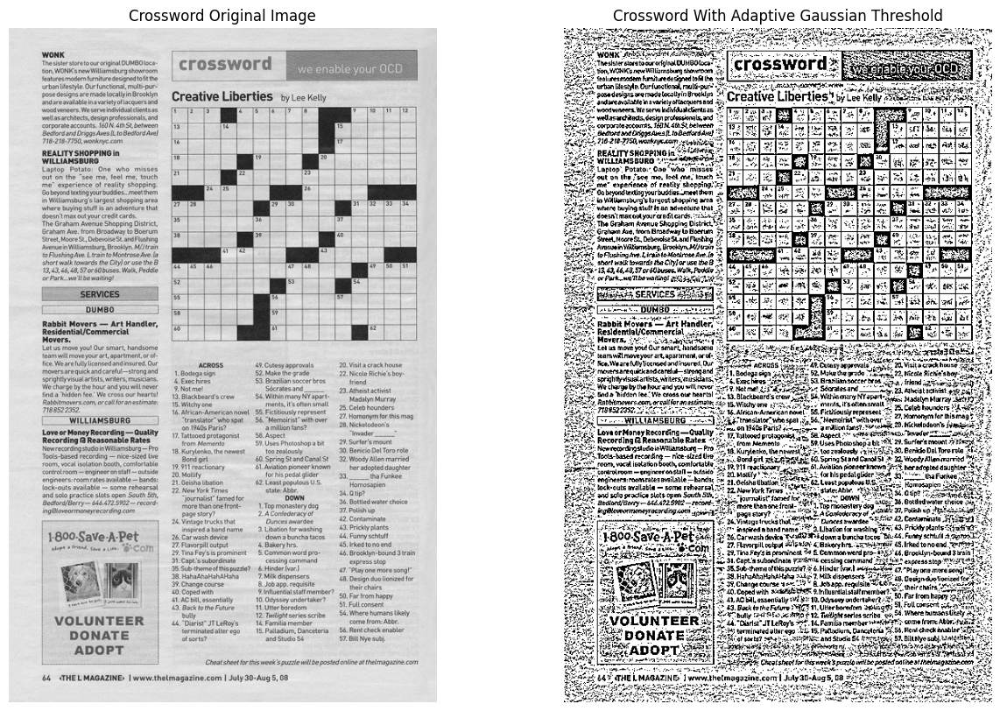

In [226]:
plt.figure(figsize=(15, 10))
plt.subplot(1, 2, 1)
plt.imshow(crossword_gray, cmap='gray')
plt.title('Crossword Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(crossword_adaptive_gaussian_threshold, cmap='gray')
plt.title('Crossword With Adaptive Gaussian Threshold')
plt.axis('off')
plt.show()